# Zomato dataset
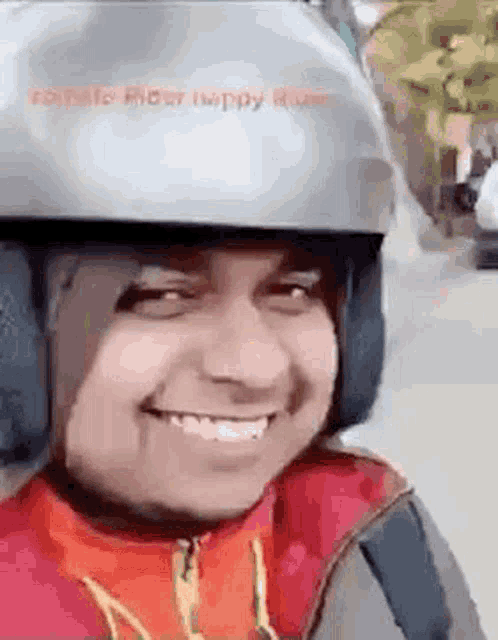

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import folium 
from folium import plugins
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [102]:
data=pd.read_csv('datasets/Bangalore_Restaurants.csv')
data.head()

,Restaurant_Name,Category,Pricing_for_2,Locality,Dining_Rating,Dining_Review_Count,Delivery_Rating,Delivery_Rating_Count,Website,Address,Phone_No,Latitude,Longitude
0,Burma Burma,"Asian, Burmese, Bubble Tea, Salad, Tea, Desser...",1500,"Indiranagar, Bangalore",4.9,2790.0,4.5,838.0,https://www.zomato.com/bangalore/burma-burma-i...,"607, Ground Floor, 12th Main, Hal 2nd Stage, I...",9.18043E+11,12.970394,77.644713
1,Windmills Craftworks,"Continental, Fast Food, Kebab, Beverages, Ital...",2500,"Windmills Craftworks, Bangalore",4.9,6543.0,4.2,524.0,https://www.zomato.com/bangalore/windmills-cra...,"78, Immaine Epip Industrial Area, Whitefield B...",9.1888E+11,12.982413,77.721979
2,CTR Shri Sagar,South Indian,150,"Malleshwaram, Bangalore",4.9,4837.0,4.3,22100.0,https://www.zomato.com/bangalore/ctr-shri-saga...,"7th Cross, Margosa Road, Malleshwaram, Bangalore",9.18023E+11,12.998270,77.569455
3,Brahmin's Coffee Bar,South Indian,100,"Basavanagudi, Bangalore",4.9,2975.0,4.4,372.0,https://www.zomato.com/bangalore/brahmins-coff...,"Ranga Rao Road, Near Basavanagudi, Bangalore",9.19845E+11,12.954043,77.568865
4,Milano Ice Cream,"Desserts, Ice Cream, Beverages",400,"Indiranagar, Bangalore",4.9,2575.0,4.4,1180.0,https://www.zomato.com/bangalore/milano-ice-cr...,"460, 2nd Cross, Krishna Temple Road, Indiranag...",9.18041E+11,12.979121,77.644039


In [5]:
data.shape

(5109, 13)

In [24]:
zomato_map=folium.Map(
    location=[12.9716,77.5946],
    zoom_start=10
)
zomato_map

In [25]:
restaurants = plugins.MarkerCluster().add_to(zomato_map)

In [33]:
for lat,long,name,rating in zip(data['Latitude'],data['Longitude'],data['Restaurant_Name'],data['Dining_Rating']):
    if rating>=4:
        icon1=folium.Icon(color='green', icon='info-sign')
    else:
        icon1=folium.Icon(color='red', icon='info-sign')
    folium.Marker(
        location=[lat,long],
        popup=name,
        icon=icon1
    ).add_to(restaurants)
zomato_map

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5109 entries, 0 to 5108
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Restaurant_Name        5109 non-null   object 
 1   Category               5109 non-null   object 
 2   Pricing_for_2          5109 non-null   int64  
 3   Locality               5109 non-null   object 
 4   Dining_Rating          5101 non-null   float64
 5   Dining_Review_Count    5101 non-null   float64
 6   Delivery_Rating        3697 non-null   float64
 7   Delivery_Rating_Count  5101 non-null   float64
 8   Website                5109 non-null   object 
 9   Address                5109 non-null   object 
 10  Phone_No               5109 non-null   object 
 11  Latitude               5109 non-null   float64
 12  Longitude              5109 non-null   float64
dtypes: float64(6), int64(1), object(6)
memory usage: 519.0+ KB


In [12]:
data[['Pricing_for_2','Dining_Rating','Dining_Review_Count','Delivery_Rating','Delivery_Rating_Count','Latitude','Longitude']].corr()

,Pricing_for_2,Dining_Rating,Dining_Review_Count,Delivery_Rating,Delivery_Rating_Count,Latitude,Longitude
Pricing_for_2,1.000000,0.427258,0.336568,0.048483,-0.074333,0.066454,0.016578
Dining_Rating,0.427258,1.000000,0.504614,0.283819,0.184954,-0.001037,0.015331
Dining_Review_Count,0.336568,0.504614,1.000000,0.131079,0.115024,-0.006284,0.008022
Delivery_Rating,0.048483,0.283819,0.131079,1.000000,0.092566,-0.024336,0.001616
Delivery_Rating_Count,-0.074333,0.184954,0.115024,0.092566,1.000000,-0.009168,0.007938
Latitude,0.066454,-0.001037,-0.006284,-0.024336,-0.009168,1.000000,0.090902
Longitude,0.016578,0.015331,0.008022,0.001616,0.007938,0.090902,1.000000


<Axes: xlabel='Dining_Rating', ylabel='Pricing_for_2'>

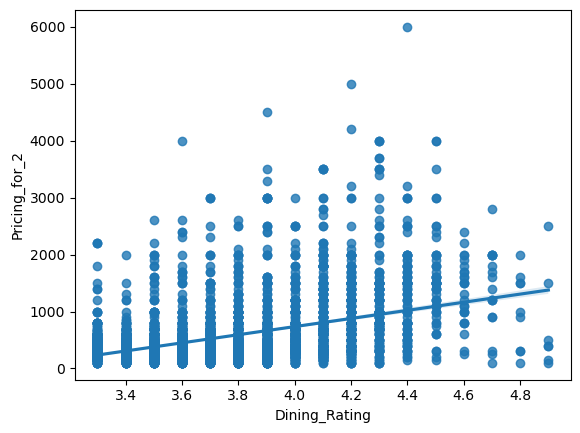

In [15]:
sns.regplot(x='Dining_Rating',y='Pricing_for_2',data=data)

In [17]:
cuisines=data['Category'].value_counts()[:10]
cuisines

Category
South Indian                           220
North Indian, Chinese                  191
North Indian                           108
Biryani, South Indian                   83
South Indian, North Indian, Chinese     61
Fast Food, Beverages                    39
Chinese                                 39
Street Food                             39
South Indian, Chinese                   38
Biryani                                 35
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='Category'>

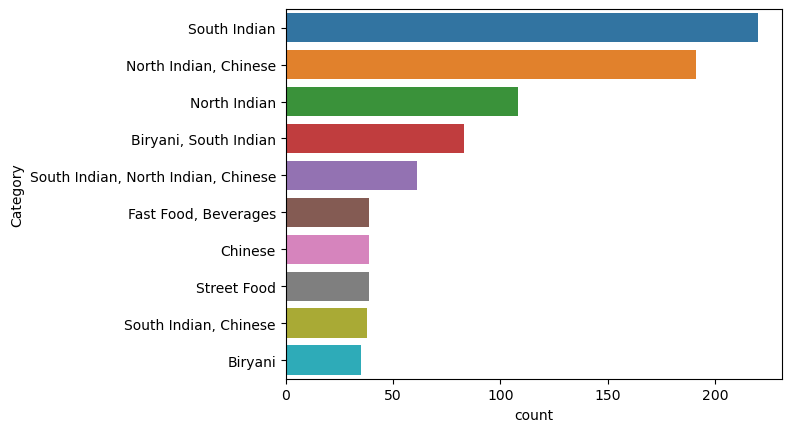

In [19]:
sns.barplot(x=cuisines,y=cuisines.index)

In [92]:
data_numeric=data[['Pricing_for_2','Dining_Rating','Dining_Review_Count','Delivery_Rating','Delivery_Rating_Count','Latitude','Longitude']]

# feature engineering 

In [118]:
x=data[['Dining_Rating','Dining_Review_Count','Delivery_Rating','Delivery_Rating_Count','Latitude','Longitude']]
x['Dining_Rating'].isna().value_counts()

Dining_Rating
False    5109
Name: count, dtype: int64

In [103]:
avg_dining_rating=data['Dining_Rating'].mean()

In [104]:
avg_dining_rating_count=data['Dining_Review_Count'].mean()

In [105]:
avg_delivery_rating=data['Delivery_Rating'].mean()

In [106]:
avg_delivery_rating_count=data['Delivery_Rating_Count'].mean()

In [109]:
data['Dining_Rating'].replace(np.nan,avg_dining_rating,inplace=True)
data['Dining_Review_Count'].replace(np.nan,avg_dining_rating_count,inplace=True)
data['Delivery_Rating'].replace(np.nan,avg_delivery_rating,inplace=True)
data['Delivery_Rating_Count'].replace(np.nan,avg_delivery_rating_count,inplace=True)

C:\Users\Anonymous\AppData\Local\Temp\ipykernel_824\1450746595.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Dining_Rating'].replace(np.nan,avg_dining_rating,inplace=True)
C:\Users\Anonymous\AppData\Local\Temp\ipykernel_824\1450746595.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

In [110]:
x=data[['Dining_Rating','Dining_Review_Count','Delivery_Rating','Delivery_Rating_Count','Latitude','Longitude']]
y=data['Pricing_for_2']

In [111]:
X=StandardScaler().fit_transform(x)

In [112]:
xtrain,xtest,ytrain,ytest=train_test_split(X,y,test_size=0.2,random_state=2)

In [113]:
xtrain.shape,ytrain.shape,xtest.shape,ytest.shape

((4087, 6), (4087,), (1022, 6), (1022,))

In [114]:
lr=LogisticRegression()

In [115]:
parameters={
    'C':[0.01,0.1,1],
	'penalty':['l2'],
	'solver':['lbfgs']
}

In [116]:
grid_log=GridSearchCV(
    estimator=lr,
    param_grid=parameters,
    scoring='accuracy',
    cv=10
)

In [117]:

grid_log.fit(xtrain,ytrain)

E:\anaconda3\envs\tf\lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']},
             scoring='accuracy')

In [119]:
grid_log.best_params_

{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}

In [120]:
ypred=grid_log.predict(xtest)

In [121]:
grid_log.best_score_

0.17788424660817873